<a href="https://colab.research.google.com/github/MattJCR/scrapy_faces/blob/master/scrapy_faces.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Creación del proyecto

In [1]:
# instalación de Scrapy
!pip install Scrapy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 271 kB 12.1 MB/s 
     |████████████████████████████████| 3.1 MB 25.9 MB/s 
     |████████████████████████████████| 4.0 MB 50.6 MB/s 
     |████████████████████████████████| 57 kB 1.4 MB/s 
     |████████████████████████████████| 261 kB 49.6 MB/s 
     |████████████████████████████████| 93 kB 1.2 MB/s 
     |████████████████████████████████| 74 kB 2.0 MB/s 
  Created wheel for PyDispatcher: filename=PyDispatcher-2.0.6-py3-none-any.whl size=11959 sha256=b18faf01493ed219bf6519b835822347b08449dfe93d72fa8d2b9e178f065dd5
  Stored in directory: /root/.cache/pip/wheels/dc/b9/4a/948b1176e084b9e3f85e4ffc3d08f817b1fdf0d973bbb94f81
Successfully built PyDispatcher


In [2]:
# creación del proyecto
!scrapy startproject project_faces scrapy

New Scrapy project 'project_faces', using template directory '/usr/local/lib/python3.8/dist-packages/scrapy/templates/project', created in:
    /content/scrapy

You can start your first spider with:
    cd scrapy
    scrapy genspider example example.com


In [3]:
# creación del spider
!cd scrapy/project_faces && scrapy genspider FindFaces https://www.pexels.com/

Created spider 'FindFaces' using template 'basic' in module:
  project_faces.spiders.FindFaces


## Edición de path/to/settings.py



*   USER_AGENT
*   ROBOTSTXT_OBEY
*   DEFAULT_REQUEST_HEADERS



In [4]:
%%writefile scrapy/project_faces/settings.py

BOT_NAME = 'project_faces'

SPIDER_MODULES = ['project_faces.spiders']
NEWSPIDER_MODULE = 'project_faces.spiders'

USER_AGENT = 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/107.0.0.0 Safari/537.36'

ROBOTSTXT_OBEY = False

DEFAULT_REQUEST_HEADERS = {
   'Accept': 'text/html,application/xhtml+xml,application/xml;q=0.9,*/*;q=0.8',
   'Accept-Language': 'es',
}

REQUEST_FINGERPRINTER_IMPLEMENTATION = '2.7'
TWISTED_REACTOR = 'twisted.internet.asyncioreactor.AsyncioSelectorReactor'

Overwriting scrapy/project_faces/settings.py


# Implementación del spider

In [5]:
%%writefile scrapy/project_faces/spiders/FindFaces.py
import scrapy

class FindfacesSpider(scrapy.Spider):
    name = 'FindFaces'
    allowed_domains = ['https://www.larajade.com/']
    start_urls = ['https://www.larajade.com/']
    pages = 1
    def parse(self, response):
      images = response.xpath('//body/div/div[id("site")]/div[id("content")]/main/div[contains(@class, "main-content")]/div/div/div/div/div')
      print('numero de entradas:', len(images))
      for img in images:
        img = img.xpath('img/@data-src').get()
        yield {
          'img': img
        }

Overwriting scrapy/project_faces/spiders/FindFaces.py


## Ejecución del spider

In [6]:
!cd scrapy/project_faces && scrapy crawl FindFaces -O faces.json

rm: cannot remove 'scrapy/project_faces/faces.json': No such file or directory
2022-12-08 12:59:28 [scrapy.utils.log] INFO: Scrapy 2.7.1 started (bot: project_faces)
2022-12-08 12:59:28 [scrapy.utils.log] INFO: Versions: lxml 4.9.1.0, libxml2 2.9.14, cssselect 1.2.0, parsel 1.7.0, w3lib 2.1.0, Twisted 22.10.0, Python 3.8.15 (default, Oct 12 2022, 19:14:39) - [GCC 7.5.0], pyOpenSSL 22.1.0 (OpenSSL 3.0.7 1 Nov 2022), cryptography 38.0.4, Platform Linux-5.10.133+-x86_64-with-glibc2.27
2022-12-08 12:59:28 [scrapy.crawler] INFO: Overridden settings:
{'BOT_NAME': 'project_faces',
 'NEWSPIDER_MODULE': 'project_faces.spiders',
 'REQUEST_FINGERPRINTER_IMPLEMENTATION': '2.7',
 'SPIDER_MODULES': ['project_faces.spiders'],
 'TWISTED_REACTOR': 'twisted.internet.asyncioreactor.AsyncioSelectorReactor',
 'USER_AGENT': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 '
               '(KHTML, like Gecko) Chrome/107.0.0.0 Safari/537.36'}
2022-12-08 12:59:28 [asyncio] DEBUG: Using selector: 

## Procesando las caras de las imágenes

In [7]:
from io import BytesIO
import cv2
from PIL import Image
import json
import numpy as np
import requests
from statistics import mean
import math

In [8]:
json_file = 'scrapy/project_faces/faces.json'
with open(json_file, 'r') as f:
  data = json.load(f)

images = []
for item in data:
  url = item['img']
  img = Image.open(BytesIO(requests.get(url).content))
  # img = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
  images.append(img)

In [9]:
import random
def create_collage(faces_list,size=(200, 200)):
  faces_per_row = math.ceil(math.sqrt(len(faces_list)))
  while len(faces_list)%faces_per_row != 0:
    faces_list.append(random.choice(faces_list))
  counter = 1
  matrix = None
  nueva_fila = True
  for img in faces_list:
    img = np.asarray(Image.fromarray(img).resize(size))
    if nueva_fila:
      fila = img
      nueva_fila = False
    else:
      fila = np.hstack([fila, img])
    if counter == faces_per_row:
          matrix = fila
          nueva_fila = True
    elif counter % faces_per_row == 0:
        matrix = np.vstack([matrix, fila])
        nueva_fila = True
    counter += 1
  return Image.fromarray(matrix)

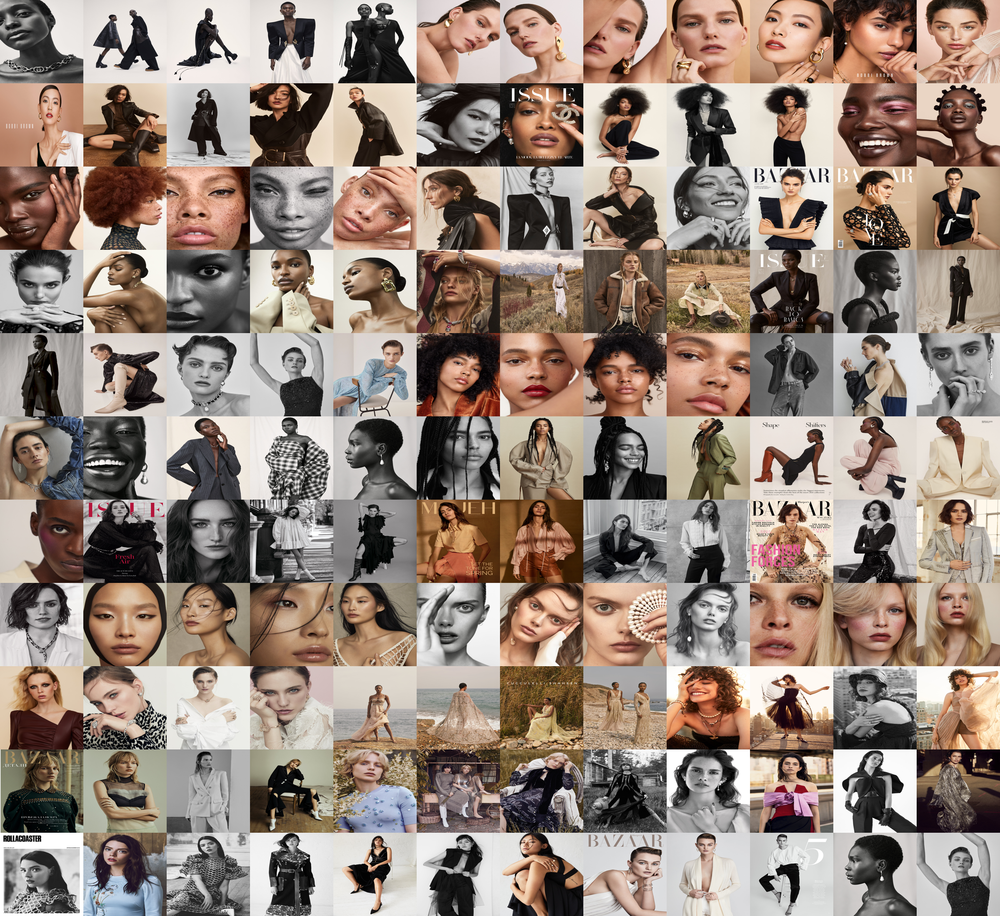

In [10]:
images_np = []
for img in images:
  images_np.append(np.asarray(img))
create_collage(images_np)

In [36]:
height = []
width = []
# Calculamos el minimo del tamaño que debe de tener una cara
for img in images:
  width.append(img.width)
  height.append(img.height)
height = math.ceil(math.sqrt(mean(height)))*2
width = math.ceil(math.sqrt(mean(width)))*2
print('width:',width,'height:',height)

width: 68 height: 78


In [40]:
def find_faces(images,width=30,height=30):
  #faceCascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")
  faceCascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_alt.xml")
  #faceCascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_alt2.xml")
  #faceCascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_alt_tree.xml")
  #faceCascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_upperbody.xml")
  face_count = 0
  faces_list = []
  for img in images:
    img = np.array(img)
    color = cv2.cvtColor(np.array(img), cv2.COLOR_BGR2GRAY)
    #color = cv2.cvtColor(np.array(img), cv2.COLOR_BGR2HSV)
    #color = cv2.cvtColor(np.array(img), cv2.COLOR_BGR2Luv)
    faces = faceCascade.detectMultiScale(
          color,
          scaleFactor = 1.06,
          minNeighbors = 10,
          minSize = (width, height)
    )
    w = img.shape[1]
    h = img.shape[0]
    for face in faces:
      x = face[1]
      y = face[0]
      w = face[3]
      h = face[2]
      faces_list.append(img[x:x+w,y:y+h])
    face_count += len(faces)
  print(face_count)
  return faces_list

74


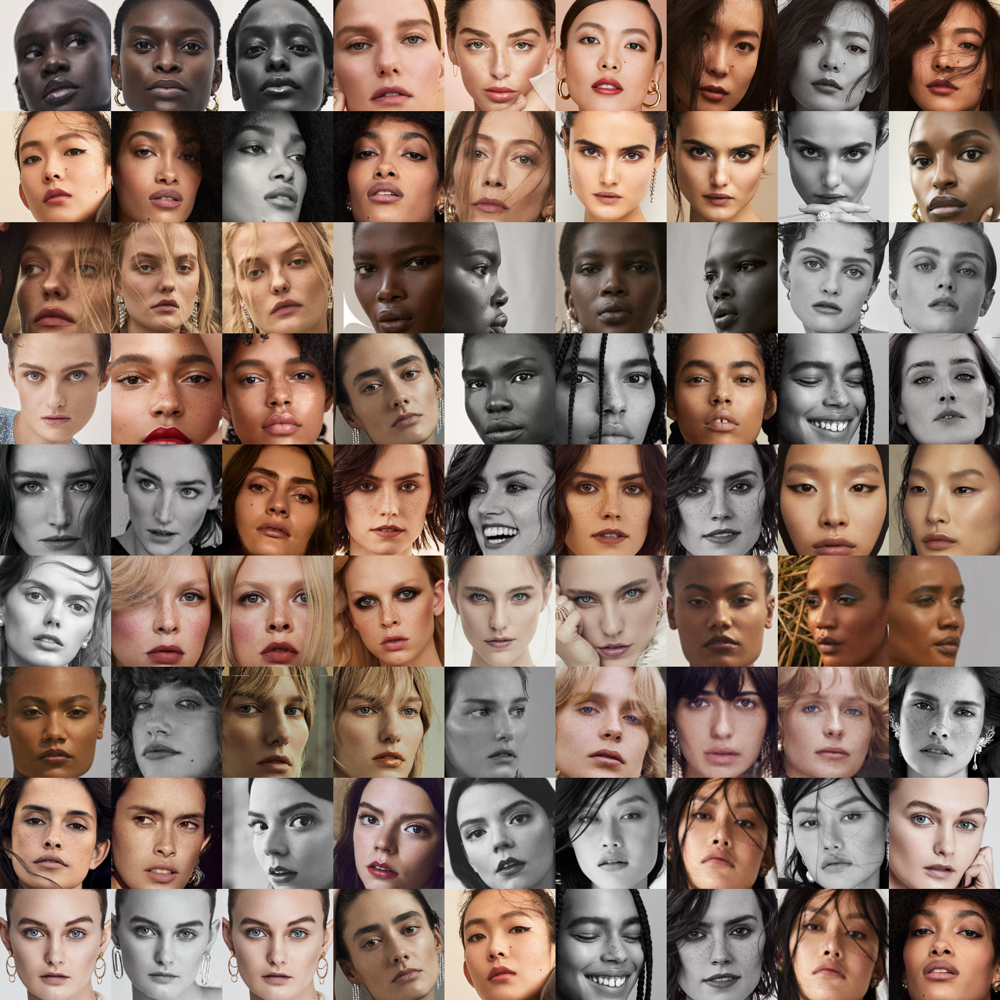

In [41]:
faces_list = find_faces(images,width,height)
create_collage(faces_list)